<h1>Zomato Banglore Dataset</h1>
The basic idea of analyzing the Zomato dataset is to get a fair idea about the factors affecting the establishment of different types of restaurant at different places in Bengaluru, aggregate rating of each restaurant, Bengaluru being one such city has more than 12,000 restaurants with restaurants serving dishes from all over the world. With each day new restaurants opening the industry has’nt been saturated yet and the demand is increasing day by day. Inspite of increasing demand it however has become difficult for new restaurants to compete with established restaurants. Most of them serving the same food. Bengaluru being an IT capital of India. Most of the people here are dependent mainly on the restaurant food as they don’t have time to cook for themselves. With such an overwhelming demand of restaurants it has therefore become important to study the demography of a location.
</br></br>
- What kind of a food is more popular in a locality. 
- Do the entire locality loves vegetarian food. If yes then is that locality populated by a particular sect of people for eg. Jain, Marwaris, Gujaratis who are mostly vegetarian. These kind of analysis can be done using the data, by studying the factors such as • Location of the restaurant • Approx Price of food  Theme based restaurant or not 
-  Which locality of that city serves that cuisines with maximum number of restaurants • The needs of people who are striving to get the best cuisine of the neighborhood • Is a particular neighborhood famous for its own kind of food.

<h2>Some of the questions discussed are:</h2>
<ol>
    <li>Which are the top restaurant chains in Bangaluru? </li>
     <li>How many of the restuarants do not accept online orders? </li>
     <li>What is the ratio b/w restaurants that provide and do not provide table booking ? </li>
     <li>Rating distribution </li>
     <li>Is there any difference b/w votes of restaurants accepting and not accepting online orders? </li>
     <li>Which are the most common restaurant type in Banglore? </li>
     <li>Cost factor ? </li>
     <li>Which are the foodie areas? </li>
     <li>Which are the most common cuisines in each locations? </li>
     <li>Extracting location information using Geopy </li>
     <li>Heatmap of restaurant count on each location </li>
     <li>Which are  the most popular cuisines of Bangalore? </li>
     <li>Heatmap of North Indian restaurants </li>
     <li>What about South  Indian cuisines? </li>
     <li>Analysing Restaurant chains  </li>
     <li>Which are the most popular casual dining restaurant chains? </li>
       <ul>
              <li>Where are their outlets located?</li>
       </ul>
     <li>Top quick bites restaurant chains in Banglore </li>
       <ul>   
              <li>Where are their outlets located?</li>
       </ul>
     <li>Top Cafes of Banglore? </li>
       <ul>
              <li>Where are their outlets located?</li>
       </ul>
     <ul>      
       <li>Wordcloud of dishes liked by cuisines.</li>
     </ul>
     <li>Analysing Reviews </li>
       <ul>
              <li>Wordcloud of restaurant reviews </li>
              <li>Rating distribution </li>
       </ul>
     </ol>

<h2>Loading libraries</h2>

In [1]:
import numpy as np
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
import re
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk

2023-03-25 19:38:51.214147: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-25 19:38:51.633966: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-03-25 19:38:51.688033: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-25 19:38:51.688049: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore 

In [2]:
df = pd.read_csv('./archive/zomato.csv')

<h2>Getting the basic ideas</h2>

In [3]:
print("Dataset contains {} rows and {} columns".format(df.shape[0], df.shape[1]))

Dataset contains 51717 rows and 17 columns


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [5]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


**Columns description**

- **url**
contains the url of the restaurant in the zomato website

- **address**
contains the address of the restaurant in Bengaluru

- **name**
contains the name of the restaurant

- **online_order**
whether online ordering is available in the restaurant or not

- **book_table**
table book option available or not

- **rate**
contains the overall rating of the restaurant out of 5

- **votes**
contains total number of rating for the restaurant as of the above mentioned date

- **phone**
contains the phone number of the restaurant

- **location**
contains the neighborhood in which the restaurant is located

- **rest_type**
restaurant type

- **dish_liked**
dishes people liked in the restaurant

- **cuisines**
food styles, separated by comma

- **approx_cost(for two people)**
contains the approximate cost for meal for two people

- **reviews_list**
list of tuples containing reviews for the restaurant, each tuple 

- **menu_item**
contains list of menus available in the restaurant

- **listed_in(type)**
type of meal

- **listed_in(city)**
contains the neighborhood in which the restaurant is listed


<h2>EDA (Exploratory Data Analysis)</h2>
Which are the top restaurants chains in Bangaluru?

Text(0.5, 0, 'Number of outlets')

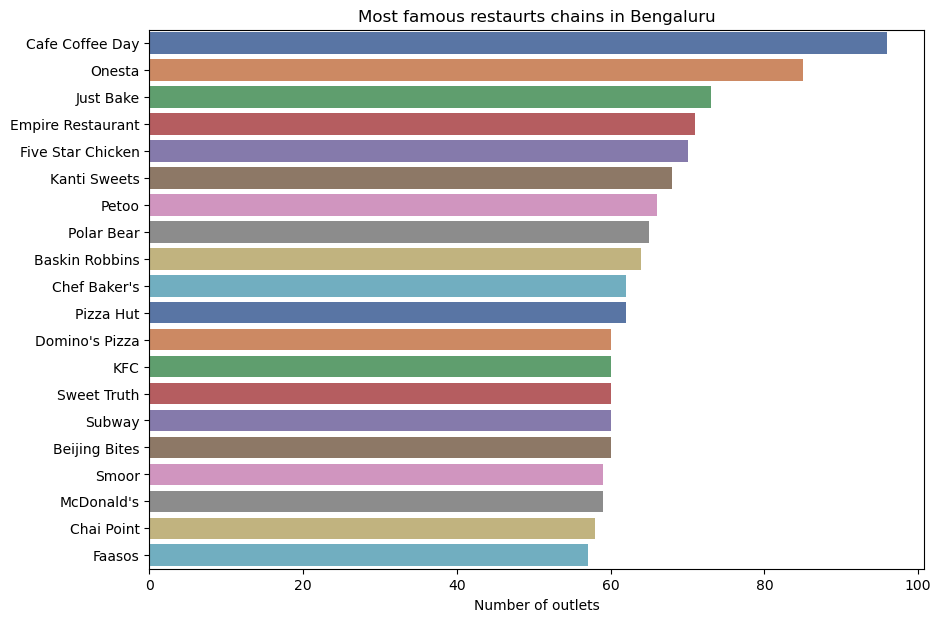

In [6]:
plt.figure(figsize=(10, 7))
chains = df['name'].value_counts()[:20]
sns.barplot(x=chains, y=chains.index,palette='deep')
plt.title("Most famous restaurts chains in Bengaluru")
plt.xlabel("Number of outlets")

- As you can see **Cafe coffee day,Onesta,Just Bake** has the most number of outlets in and around bangalore.
- This is rather interesting,we will inspect each of them later.

<h2>How many of the restuarants do not accept online orders?</h2>

In [7]:
x = df['online_order'].value_counts()
colors = ['#FEBFB3', '#E1396C']

trace = go.Pie(labels=x.index, values=x, textinfo="value", marker=dict(colors=colors, line=dict(color='#000000', width=2)))
layout = go.Layout(title="Accepting vs not accepting online orders", width=500, height=500)
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

1. As clearly indicated,almost 60 per cent of restaurants in Banglore accepts online orders.
2. Nearly 40 per cent of the restaurants do not accept online orders.
3. This might be because of the fact that these restaurants cannot afford to pay commission to zomoto for giving them orders online.
   zomato may want to consider giving them some more benefits if they want to increse the number of restaurants serving their customers online.
<h2>What is the ratio b/w restaurants that provide and do not provide table booking ?</h2>

In [8]:
x = df['book_table'].value_counts()
colors = ['#96D38C', '#D0F9B1']

trace = go.Pie(labels=x.index, values=x, textinfo="value", marker=dict(colors=colors, line=dict(color='#000000', width=2)))
layout = go.Layout(title="Table Booking", width=500, height=500)
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig, filename='pie_chart_subplots')

1. Almost 90 percent of restaurants in Banglore do not provide table booking facility.
2. In India you cannot find table booking facility in any average restaurants,usually only five star restaurants provides table booking.
3. We will inspect this further.
<h2>Rating Distribution</h2>

In [9]:
df['rate']

0         4.1/5
1         4.1/5
2         3.8/5
3         3.7/5
4         3.8/5
          ...  
51712    3.6 /5
51713       NaN
51714       NaN
51715    4.3 /5
51716    3.4 /5
Name: rate, Length: 51717, dtype: object

<Figure size 600x500 with 0 Axes>

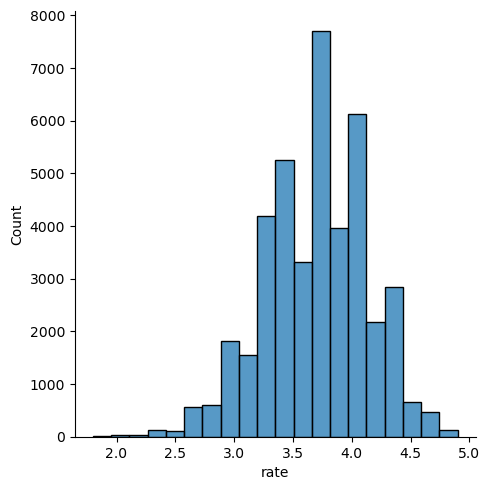

In [10]:
plt.figure(figsize=(6, 5))
rating = df['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3) else np.nan).dropna()
sns.displot(rating, bins=20)

1. Almost more than 50 percent of restaurants has rating between 3 and 4.
2. Restaurants having rating more than 4.5 are very rare.

In [11]:
cost_dist = df[['rate', 'approx_cost(for two people)', 'online_order']].dropna()
cost_dist['rate'] = cost_dist['rate'].apply(lambda x: float(x.split('/')[0] if len(x)>3 else 0))
cost_dist['approx_cost(for two people)'] = cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',', '')))

<h2>Cost vs Rating</h2>

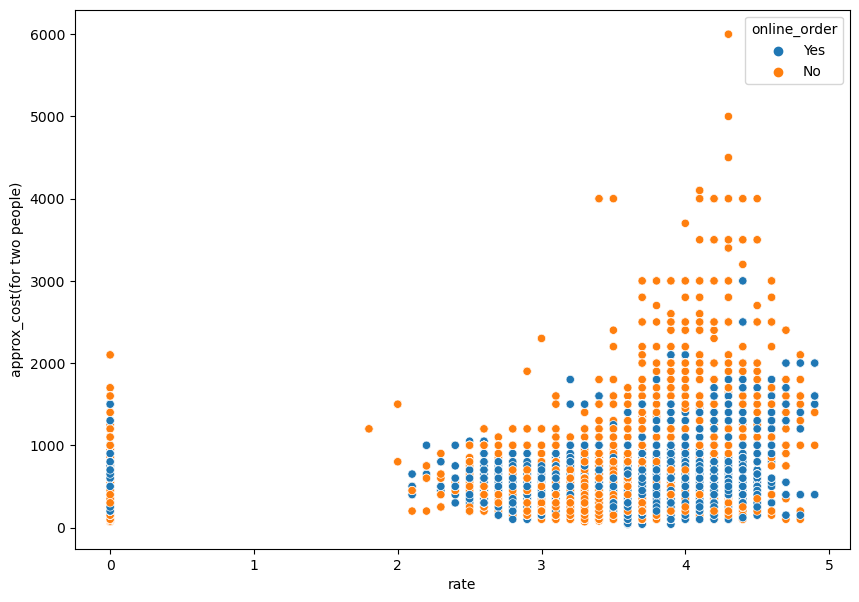

In [12]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x="rate", y='approx_cost(for two people)', hue='online_order', data=cost_dist)
plt.show()

<h2>Distribution of cost for two people</h2>

/home/neel/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



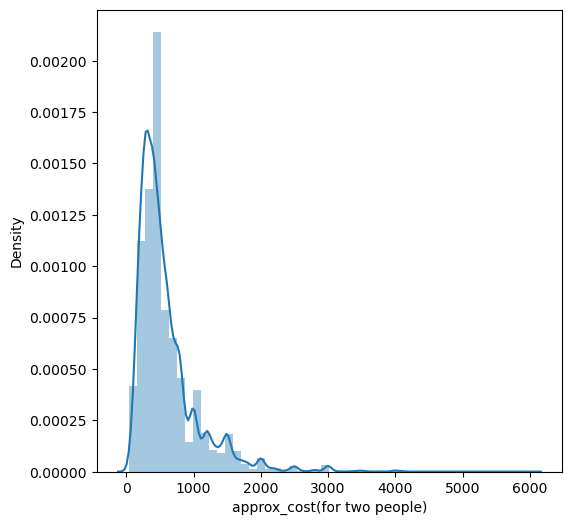

In [13]:
plt.figure(figsize=(6, 6))
sns.distplot(cost_dist['approx_cost(for two people)'])
plt.show()

- We can see that the distribution if left skewed.
- This means almost 90percent of restaurants serve food for budget less than 1000 INR.($15)
<h2>Is there any difference b/w votes of restaurants accepting and not accepting online orders?<h2>

In [14]:
votes_yes = df[df['online_order']=="Yes"]['votes']
trace0 = go.Box(y=votes_yes, name="accepting online orders", marker=dict(color='rgb(214, 12, 140)'))

votes_no = df[df['online_order']=="No"]['votes']
trace1 = go.Box(y=votes_no, name="Not accepting online orders", marker= dict(color='rgb(0, 128, 128)'))

layout = go.Layout(
    title="Box Plots of votes", width=800, height=500
)

data = [trace0, trace1]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

1. Yes,you can observe that median number of votes for both categories vary.
2. Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.
<h2>Which are the most common restaurant type in Banglore?</h2>

/home/neel/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 0, 'count')

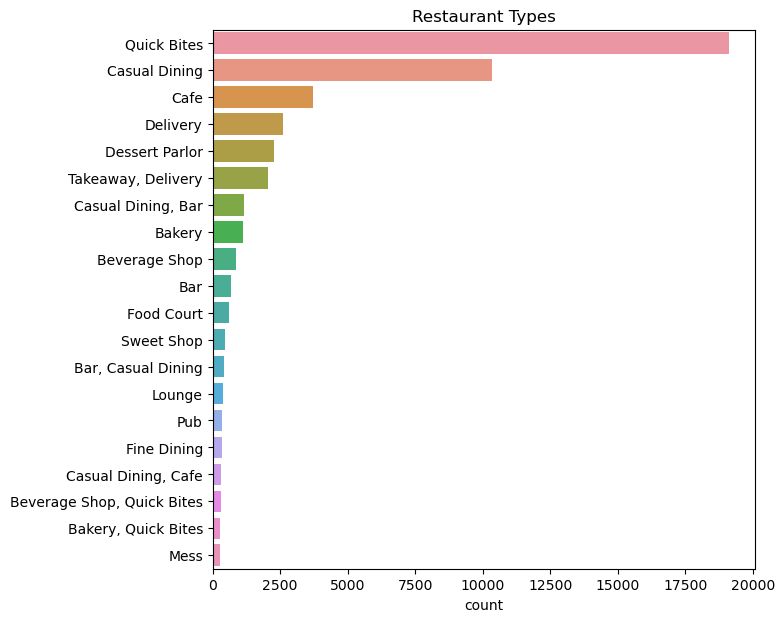

In [15]:
plt.figure(figsize=(7, 7))
rest = df['rest_type'].value_counts()[:20]
sns.barplot(rest, rest.index)
plt.title("Restaurant Types")
plt.xlabel("count")

1. No doubt about this as Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.
2. We can observe tha Quick Bites type restaurants dominates.
<h2>Cost Factor?</h2>

In [16]:
trace0 = go.Box(y=df['approx_cost(for two people)'], name="accepting online orders", marker=dict(color='rgb(214, 12, 140)',))
data = [trace0]
layout = go.Layout(title="Box Plot of approximate cost", width=800, height=500, yaxis=dict(title="Price"))
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

1. The median approximate cost for two people is 400 for a single meal.
2. 50 percent of restaurants charge between 300 and 650 for single meal for two people.
<h2>Finding best budget Restaurants in any Location</h2>
- I have implemented a simple filtering mechanism to find best budget restaurants in any locations in Bangalore.
- You can pass location and restaurant type as parameteres,function will return name of restaurants.

In [17]:
cost_dist = df[['rate', 'approx_cost(for two people)', 'location', 'name', 'rest_type']].dropna()
cost_dist['rate'] = cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)'] = cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',', '')))

In [18]:
def return_budget(location, rest):
    budget = cost_dist[(cost_dist['approx_cost(for two people)']<=400) & (cost_dist['location']==location) & (cost_dist['rate']>4 & (cost_dist['rest_type']==rest))]
    return (budget['name'].unique())

In [19]:
return_budget('BTM', "Quick Bites")

array(['Hiyar Majhe Kolkata', 'Sri Lakshmi Dhaba', 'XO Belgian Waffle',
       'Swadista Aahar', 'Vegetarea', 'Swad Punjab Da', 'Roti Wala',
       'Paratha Junction', 'Kalingas', 'Kullad Cafe', 'Litti Twist',
       'Chicken Magic', 'New Mahesh Friends Food Corner', 'MRA',
       'Shaadi Ki Biryani', 'Mahesh Friends Food Center',
       'Sri Punjabi Dhaba', 'Polar Bear', 'Sher-E-Punjab',
       'Aramane Donne Biriyani', 'Biriyani Bhatti', 'RSS Donne Biryani',
       'Veruthe Oru Thattukada', 'The Shawarma Shop', 'Pathaan Sir',
       'Hari Super Sandwich', 'Chokha Chowka', 'Gorbandh',
       'Indiana Burgers', 'Yum In My Tum', "Magix's Parattha Roll",
       'AlienSip', 'Waffle Head', 'The Bong Palate', 'Lassi Berg',
       'Manchu Cafe', 'Lassi Darbar', 'Nanna Munna Paratha House',
       'Shagun Sweets & Foods', 'Delhi Biryani Cafe',
       'Rock Stone Ice Cream Factory', 'Natural Mumbai Kulfi',
       'RK Fresh Food', 'The Food Cottage', 'DeliBox.in',
       'Taste Of Kolkata', 'Bi

<h2>Which are the foodie areas?</h2>

/home/neel/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='location'>

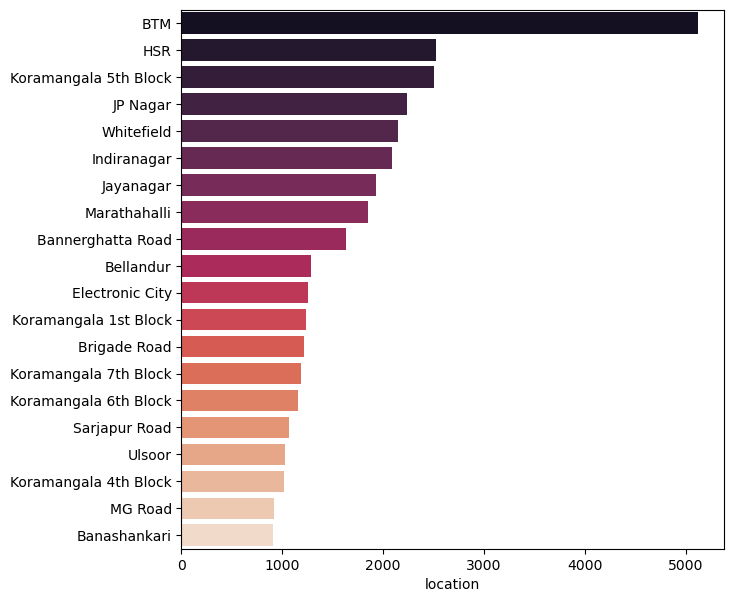

In [20]:
plt.figure(figsize=(7, 7))
Rest_locations = df['location'].value_counts()[:20]
sns.barplot(Rest_locations, Rest_locations.index, palette="rocket")

a1. We can see that **BTM,HSR and Koranmangala 5th block** has the most number of restaurants.
2. BTM dominates the section by having more than 5000 restaurants.
<h2>Which are the most common cuisines in each locations?</h2>

In [21]:
df_1=df.groupby(['location','cuisines']).agg('count')
data=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})

In [22]:
data.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",379
1,0,BTM,North Indian,340
2,0,BTM,Biryani,120
3,1,Banashankari,South Indian,86
4,1,Banashankari,"North Indian, Chinese",61
5,1,Banashankari,North Indian,36
6,2,Banaswadi,South Indian,37
7,2,Banaswadi,"North Indian, Chinese",24
8,2,Banaswadi,Biryani,23
9,3,Bannerghatta Road,"North Indian, Chinese",130


<h2>Extracting location information using Geopy</h2>

In [23]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat = []
lon = []
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat.append(np.nan)
        lon.append(np.nan)
    else:
        lat.append(location.latitude)
        lon.append(location.longitude)


locations['lat']=lat
locations['lon']=lon
locations.to_csv('locations.csv',index=False)

In [24]:
locations["Name"] = locations['Name'].apply(lambda x : x.replace("Bangalore", "")[1:])
locations.head()

,Name,lat,lon
0,Banashankari,12.915221,77.573598
1,Basavanagudi,12.941726,77.575502
2,Mysore Road,12.928899,77.503644
3,Jayanagar,12.929273,77.582423
4,Kumaraswamy Layout,12.908149,77.555318


- We have found out latitude and longitude of each location listed in the dataset using geopy.
- This is used to plot maps.
<h2>Heatmap of restaurant count on each location</h2>

In [25]:
Rest_locations = pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name', 'count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
locations.head()
Rest_locations['count'].max()

5124

In [26]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [27]:
Rest_locations.head()

,Name,count,lat,lon
0,BTM,5124,12.911276,77.604565
1,HSR,2523,12.911623,77.638862
2,Koramangala 5th Block,2504,12.934843,77.618977
3,JP Nagar,2235,12.880358,77.579658
4,Whitefield,2144,12.969637,77.749745


In [28]:
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [29]:
basemap

1. It is clear that restaurants tend to concentrate in central bangalore area.
2. The clutter of restaurants lowers are we move away from central.
3. So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.
<h2>Which are the most popular cuisines of Bangalore?</h2>

/home/neel/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Most popular cuisines of Banalore')

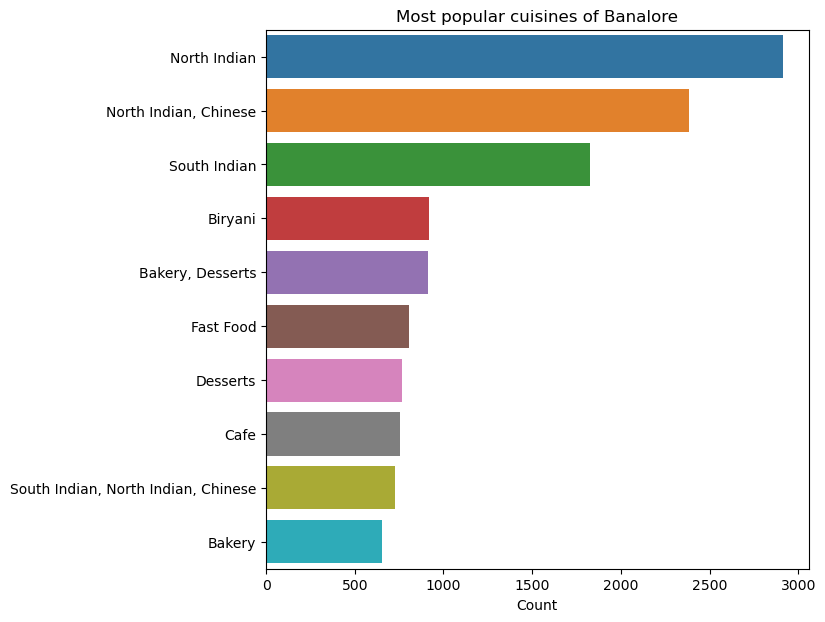

In [30]:
plt.figure(figsize=(7, 7))
cuisines = df['cuisines'].value_counts()[:10]
sns.barplot(cuisines, cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Banalore")

1. We can observe that **North Indian,chinese,South Indian and Biriyani** are most common.
2. Is this imply the fact that Banglore is more influenced by North Indian culture more than South?
- We will inspect further......
<h2>Heatmap of North Indian restaurants</h2>

In [31]:
def produce_chains(col, name):
    data = pd.DataFrame(df[df[col]==name]).groupby(['location'], as_index=False)['url'].agg('count')
    data.columns=['Name', 'count']
    print(data.head())
    data = data.merge(locations, on="Name", how='left').dropna()
    return data

In [32]:
North_India = produce_chains('cuisines', 'North Indian')
North_India

                Name  count
0                BTM    340
1       Banashankari     36
2          Banaswadi     12
3  Bannerghatta Road     75
4       Basavanagudi     21


,Name,count,lat,lon
0,BTM,340,12.911276,77.604565
1,Banashankari,36,12.915221,77.573598
2,Banaswadi,12,13.014162,77.651854
3,Bannerghatta Road,75,12.879971,77.595784
4,Basavanagudi,21,12.941726,77.575502
...,...,...,...,...
62,Ulsoor,58,12.977879,77.624670
64,Vasanth Nagar,22,12.988721,77.585169
65,Whitefield,188,12.969637,77.749745
66,Wilson Garden,47,12.948934,77.596827


In [33]:
basemap = generateBaseMap()
HeatMap(North_India[['lat', 'lon', 'count']].values.tolist(), zoom=20, radius=15).add_to(basemap)
basemap

1. Interesting to see a cluster of North Indian Restaurants in South Bangalore area !
2. This may indicate that these areas are more populated by North Indians.
<h2>What about South Indian Cuisines?</h2>

In [34]:
food = produce_chains('cuisines', 'South Indian')
basemap = generateBaseMap()
HeatMap(food[['lat', 'lon', 'count']].values.tolist(), zoom=20, radius=15).add_to(basemap)
basemap

                Name  count
0                BTM    113
1       Banashankari     86
2          Banaswadi     37
3  Bannerghatta Road     48
4       Basavanagudi     89


1. They tend to span all over Bangalore.
2. South Indian cuisines tend to cluster near central Bangalore.
<h2>Analysing Restaurants Chains</h2>

In [35]:
def produce_chains(name):
    data_chain = pd.DataFrame(df[df["name"]==name]['location'].value_counts().reset_index())
    data_chain.columns = ['Name', 'count']
    data_chain = data_chain.merge(locations, on="Name", how="left").dropna()
    return data_chain

In [36]:
df_1 = df.groupby(['rest_type', 'name']).agg('count')
datas = df_1.sort_values(['url'], ascending=False).groupby(['rest_type'], 
            as_index=False).apply(lambda x : x.sort_values(by='url', 
                ascending=False).head(3)['url'].reset_index().rename(columns={'url':'count'}))
mapbox_access_token="pk.eyJ1Ijoic2hhaHVsZXMiLCJhIjoiY2p4ZTE5NGloMDc2YjNyczBhcDBnZnA5aCJ9.psBECQ2nub0o25PgHcU88w"

<h2>Which are the most popular casual dining restaurnt chains?</h2>

In [37]:
datas

rest_type                  name  count
0  0                 Bakery             Just Bake     49
   1                 Bakery  INDULGE by InnerChef     32
   2                 Bakery             Warm Oven     28
1  0  Bakery, Beverage Shop       Arya S.L.Bakery      6
   1  Bakery, Beverage Shop    Sapna's Magic Oven      5
...                     ...                   ...    ...
91 1               Takeaway        TheRiceBowl.In      8
   2               Takeaway            Lassi Berg      7
92 0     Takeaway, Delivery         The Good Bowl     30
   1     Takeaway, Delivery      BOX8- Desi Meals     27
   2     Takeaway, Delivery            Juice Shop     19

[216 rows x 3 columns]

In [38]:
casual = datas[datas['rest_type']=='Casual Dining']
casual

rest_type                name  count
27 0  Casual Dining   Empire Restaurant     58
   1  Casual Dining       Beijing Bites     48
   2  Casual Dining  Mani's Dum Biryani     47

- We can see tht **Empire restaurant,Beijing bites and Mani's dum biriyani** are the most popular casual dining restaurant chains in Bangalore.
- We will inspect them further...
<h2>Where are their outlets located?</h2>

In [39]:
def produce_trace(data_chain, name):
    data_chain['text'] = data_chain['Name']+'<br>'+data_chain['count'].astype(str)
    trace = go.Scattermapbox(
        
        lat = data_chain['lat'],
        lon = data_chain['lon'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=data_chain['count']*4
        ),
        text= data_chain['text'], name=name
    )
    return trace

In [40]:
casual

rest_type                name  count
27 0  Casual Dining   Empire Restaurant     58
   1  Casual Dining       Beijing Bites     48
   2  Casual Dining  Mani's Dum Biryani     47

In [41]:
data = []
for row in casual['name']:
    data_chain = produce_chains(row)
    trace_0 = produce_trace(data_chain, row)
    data.append(trace_0)
    
layout = go.Layout(title="Casual Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

1. We can see that **Mani's dum biriyani** restaurant has half of their restaurants in central Banglore.
2. ** Empire Restaurant** is present in all over Banglore.
3. **Mani's dum Biriyani** has 12 outlets in ulsoor,which is the most in a single location.
<h2>Top quick bites restaurant chains in Banglore</h2>

In [42]:
quick = datas[datas['rest_type']=='Quick Bites']
quick

rest_type               name  count
78 0  Quick Bites  Five Star Chicken     69
   1  Quick Bites     Domino's Pizza     60
   2  Quick Bites         McDonald's     59

- Surprisingly  ** Five star chicken** dominates in quick bites restaurant types overtaking famous **Domino's Pizza and McDonald's**.
- Five Star Chicken is a branch of Charoen Pokphand Group Foods, a Thai multinational conglomerate with over $12 billion business in Agro and Food       Industries. Five Star Chicken specialties in fried chicken.
<h2>Where are their outlets located</h2>

In [43]:
data = []
for row in quick['name']:
    data_chain = produce_chains(row)
    trace_0 = produce_trace(data_chain, row)
    data.append(trace_0)
    
layout = go.Layout(title="Quick Bites Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0, style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

<h2>Top Cafes of Banglore?</h2>

In [44]:
cafe = datas[datas['rest_type']=='Cafe']
cafe

rest_type                 name  count
19 0      Cafe      Cafe Coffee Day     96
   1      Cafe  Smally's Resto Cafe     54
   2      Cafe         Mudpipe Cafe     39

- No surprises,Cafe coffee day restaurant dominated way over other cafe chains in Banglore.
- Cafe coffee day has 96 outlets in Banglore.
- Café Coffee Day was started as a retail restaurant in 1996. The first CCD outlet was set up on July 11, 1996, at Brigade Road, Bengaluru, Karnataka.
<h2>Where are their outlets located?</h2>

In [45]:
data = []
for row in cafe['name']:
    data_chain = produce_chains(row)
    trace_0 = produce_trace(data_chain, row)
    data.append(trace_0)
    
layout = go.Layout(title="Cafe Restaurant chains locations around Banglore",
                   autosize=True,
                   hovermode='closest',
                   mapbox=dict(
                       accesstoken=mapbox_access_token,
                       bearing=0, style="streets",
                       center=dict(
                           lat=12.96,
                           lon=77.59
                       ),
                       pitch=0,
                       zoom=10
                   ),
    )
fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

<h2>Word Cloud of dishes liked by cuisines.</h2>

In [46]:
df['dish_liked'] = df['dish_liked'].apply(lambda x: x.split(',') if type(x)==str else [''])

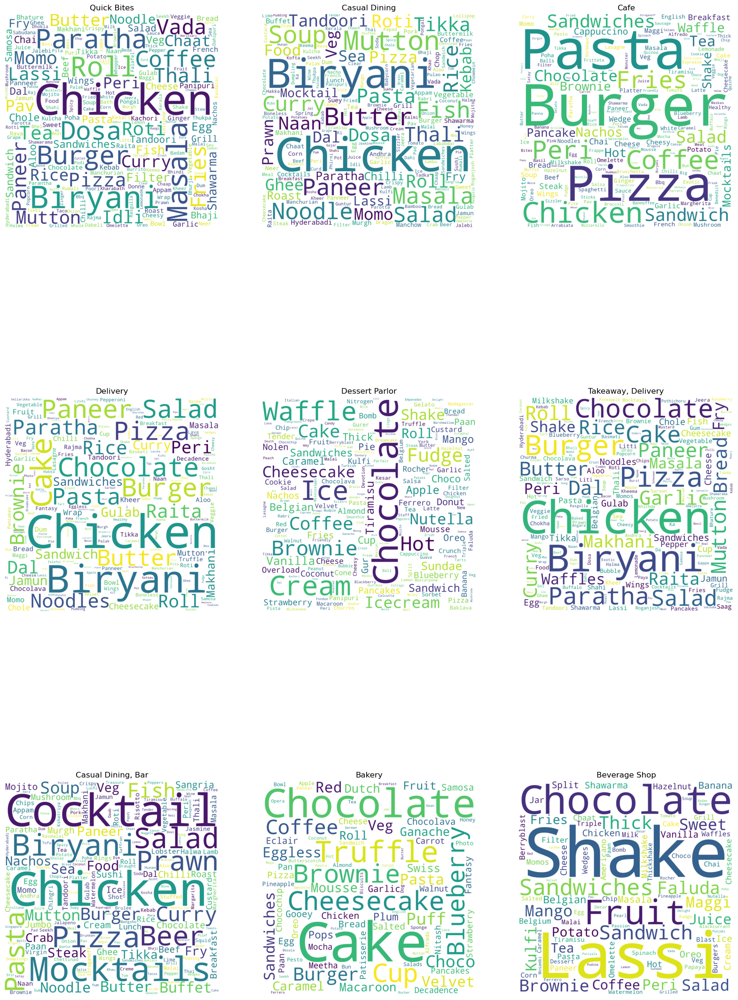

In [47]:
rest=df['rest_type'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=df[df['rest_type']==r]['dish_liked'].values.tolist()
        corpus=','.join(x  for list_words in corpus for x in list_words)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        
produce_wordcloud(rest)

<h2>Analysing Reviews</h2>
- In this section we will go on to prepare reviews dataframe.
</br>- We will extract reviews and ratings of each restaurant and create a dataframe with it.


In [48]:
all_ratings = []

for name, ratings in tqdm(zip(df['name'], df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name, score, doc])

51717it [00:14, 3571.80it/s]


In [49]:
rating_df = pd.DataFrame(all_ratings, columns=['name', 'rating', 'review'])
rating_df['review'] = rating_df['review'] = rating_df['review'].apply(lambda x: re.sub('[^a-zA-Z0-9\s]', "", x))

In [50]:
rating_df['review']

0          A beautiful place to dine inThe interiors take...
1          I was here for dinner with my family on a week...
2          Its a restaurant near to Banashankari BDA Me a...
3          We went here on a weekend and one of us had th...
4          The best thing about the place is its ambiance...
                                 ...                        
1319963    My review based on food drink service\n\nFood ...
1319964    I visited chime bar at Sheraton hotel it was n...
1319965    This restaurant is situated inside grand Shera...
1319966    Great ambience  looking nice good selection of...
1319967    The nest is one of the best bar in WhitefieldT...
Name: review, Length: 1319968, dtype: object

In [51]:
rating_df.to_csv("Ratings.csv")

In [52]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


<h2>WordCloud of Reviews of restaurant chains</h2>

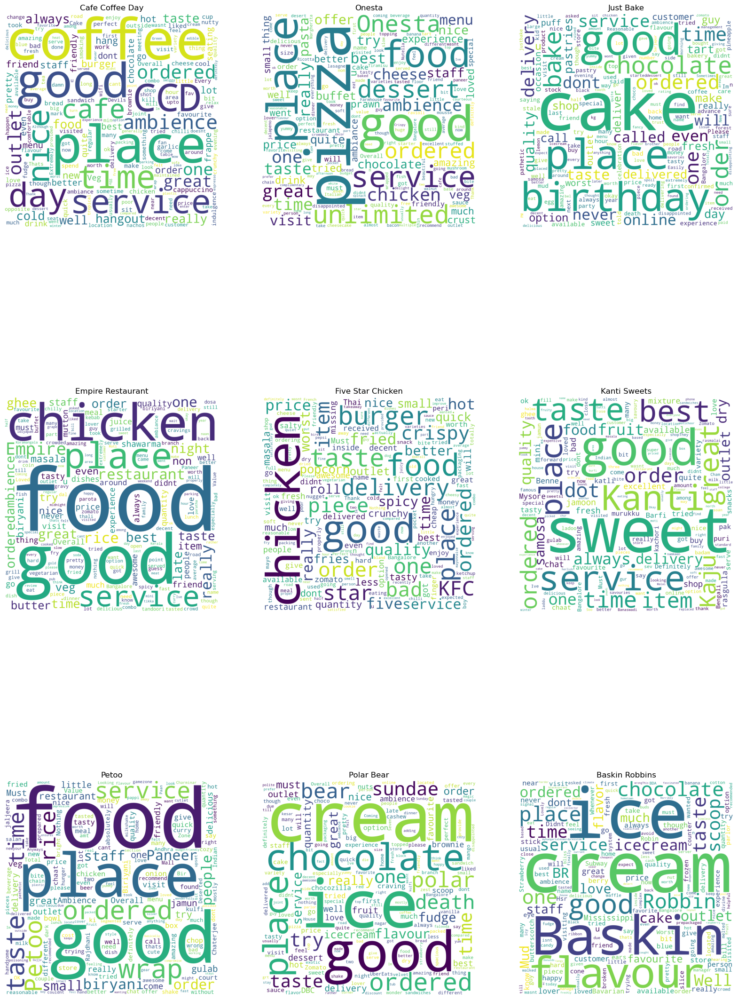

In [53]:
rest = df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    plt.figure(figsize=(20, 30))
    for i, r in enumerate(rest):
        plt.subplot(3,3, i+1)
        corpus = rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus = ' '.join(x for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False, width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        
produce_wordcloud(rest)

<h2>Rating distribution</h2>

Text(0, 0.5, 'count')

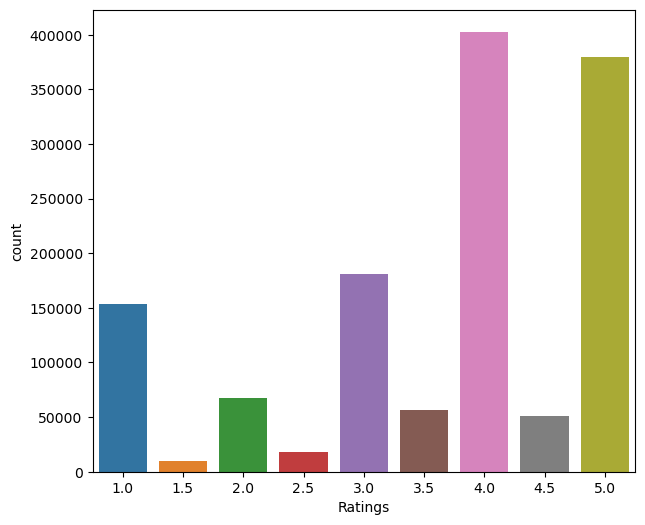

In [54]:
plt.figure(figsize=(7, 6))
rating = rating_df['rating'].value_counts()
sns.barplot(x=rating.index, y=rating)
plt.xlabel("Ratings")
plt.ylabel('count')

<h2>Topic Modelling</h2>
We will do topic modelling for postive and negative comments seperately to understand the different between the two types.
<h2>Topic modelling for positive comments</h2>
<ul>
<li>As the first step we will divide comments as negative and positive on the basis on rating provided.</li>
<li>Comments with rating below 2.5 is classified as negative and greater tham 2.5 as classified as positive.</li>
</ul>

In [55]:
rating_df['sent'] = rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)

Now,
   - we will remove stopwords
   - Lemmatize each word
   - Create corpus
   - Tokenize them

In [56]:
stops = stopwords.words('english')
lem = WordNetLemmatizer()
corpus = ' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==1]['review'][:3000] if x not in stops)
tokens = word_tokenize(corpus)

Now we will use the Term Frequency Inverse doc doc frequency (TFIDF) to vectorize the tokens.

In [57]:
vect = TfidfVectorizer()
vect_fit = vect.fit(tokens)

<h2>Latent Dirichlet Allocation</h2>

In [58]:
id_map = dict((v, k) for k, v in vect.vocabulary_.items())
vectorized_data = vect_fit.transform(tokens)
gensim_corpus = gensim.matutils.Sparse2Corpus(vectorized_data, documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus, id2word=id_map, num_topics=5, random_state=34, passes=25)


<h2>Visualizing Output</h2>
When it comes to the keywords in the topics, the importance (weights) of the keywords matters. Along with that, how frequently the words have appeared in the documents is also interesting to look.

Let’s plot the word counts and the weights of each keyword in the same chart.

You want to keep an eye out on the words that occur in multiple topics and the ones whose relative frequency is more than the weight. Often such words turn out to be less important. The chart I’ve drawn below is a result of adding several such words to the stop words list in the beginning and re-running the training process.

In [59]:
counter = Counter(corpus)

/tmp/ipykernel_4580/2544432806.py:19: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/2544432806.py:19: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/2544432806.py:19: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/2544432806.py:19: UserWarning:

FixedFormatter should only be used together with FixedLocator



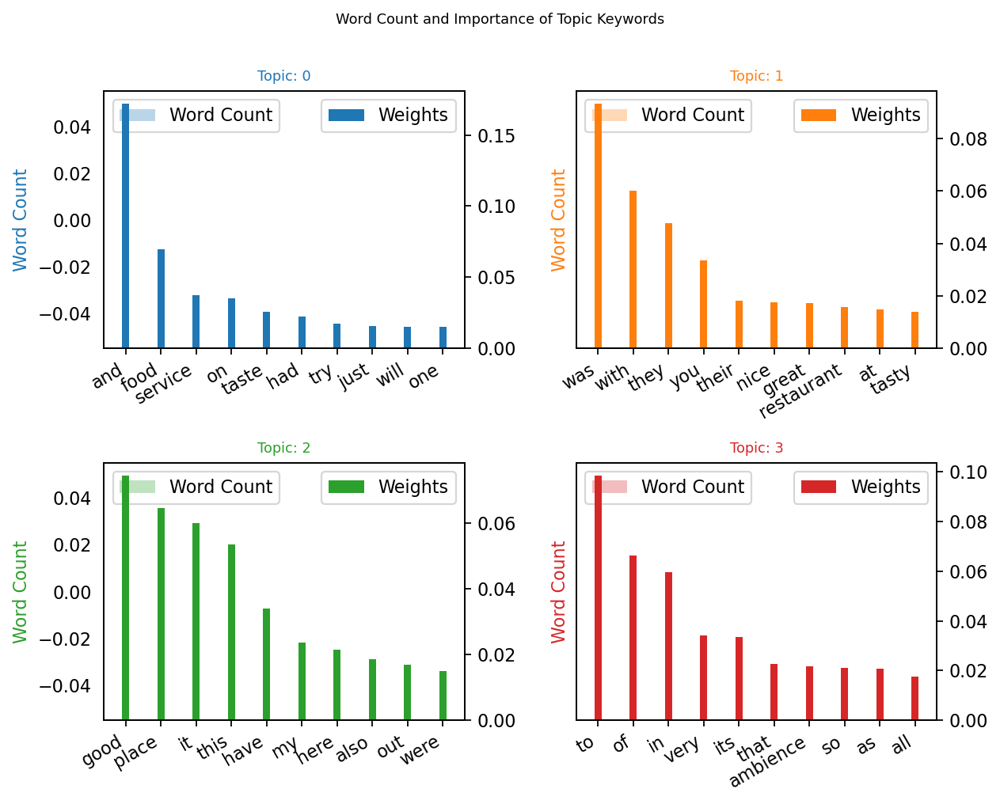

In [60]:
out = []
topics = ldamodel.show_topics(formatted=False)
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i, weight, counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

# Plot word count and weights of Topic keywords
fig, axes = plt.subplots(2, 2, figsize=(8, 6),sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height='word_count', data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label="Word Count")
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height='importance', data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label="Weights")
    ax.set_ylabel('Word Count', color=cols[i])
    ax.set_title('Topic: '+str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()

<h2>Topic modeling for negative comments</h2>

In [61]:
stops=stopwords.words('english')
lem=WordNetLemmatizer()
corpus=' '.join(lem.lemmatize(x) for x in rating_df[rating_df['sent']==0]['review'][:3000] if x not in stops)
tokens=word_tokenize(corpus)

In [62]:
vect=TfidfVectorizer()
vect_fit=vect.fit(tokens)
id_map=dict((v,k) for k,v in vect.vocabulary_.items())
vectorized_data=vect_fit.transform(tokens)
gensim_corpus=gensim.matutils.Sparse2Corpus(vectorized_data,documents_columns=False)
ldamodel = gensim.models.ldamodel.LdaModel(gensim_corpus,id2word=id_map,num_topics=5,random_state=34,passes=25)

/tmp/ipykernel_4580/1144069009.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/1144069009.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/1144069009.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_4580/1144069009.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator



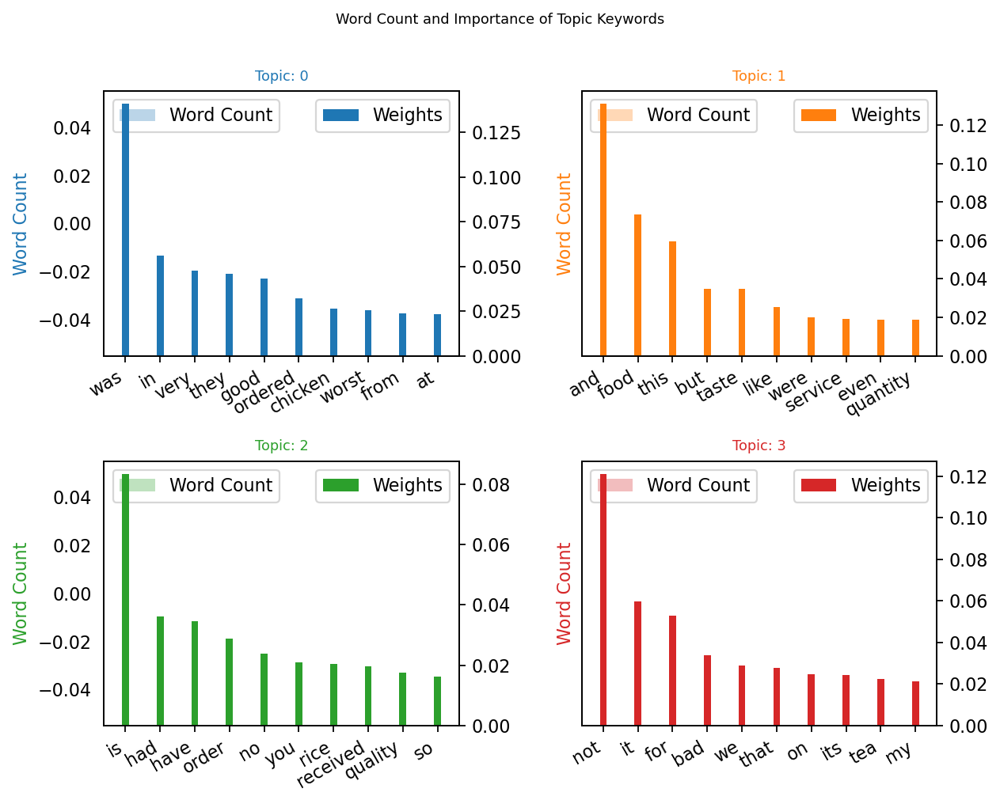

In [63]:
counter=Counter(corpus)
out=[]
topics=ldamodel.show_topics(formatted=False)
for i,topic in topics:
    for word,weight in topic:
        out.append([word,i,weight,counter[word]])

dataframe = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        


# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(8,6), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.3, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=dataframe.loc[dataframe.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    #ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=8)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(dataframe.loc[dataframe.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=8, y=1.05)    
plt.show()

- We can clearly observe the difference between the two types of comments
- The words used are clearly distinguishable.
- The words used in negative comments are clearly critisizing.
- The word used in positive comments  are clearly appreciating.
<h2>T-SNE of Reviews</h2>
(t-SNE) t-Distributed Stochastic Neighbor Embedding is a non-linear dimensionality reduction algorithm used for exploring high-dimensional data. It maps multi-dimensional data to two or more dimensions suitable for human observation. With help of the t-SNE algorithms, you may have to plot fewer exploratory data analysis plots next time you work with high dimensional data.

In this section we will visualize words used in reviews in a 2 dimensional space.
- For that we will first lemmatize and tokenize each reviews and build a corpus out of it.

In [64]:
stops = set(stopwords.words('english'))
lem = WordNetLemmatizer()
corpus = []
for review in tqdm(rating_df['review'][:10000]):
    words = []
    for x in word_tokenize(review):
        x = lem.lemmatize(x.lower())
        if x not in stops:
            words.append(x)
    
    corpus.append(words)

100%|██████████| 10000/10000 [00:02<00:00, 3908.38it/s]


Now we will use word2vec to represent each word as a vector.

In [65]:
model = word2vec.Word2Vec(corpus, window=20, min_count=200, workers=4)

In [66]:
def tsne_plot(model):
    "Creates and TSNE model and plots it"
    labels = []
    tokens = []

    for word in model.wv.index_to_key:
        tokens.append(model.wv[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(10, 10)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



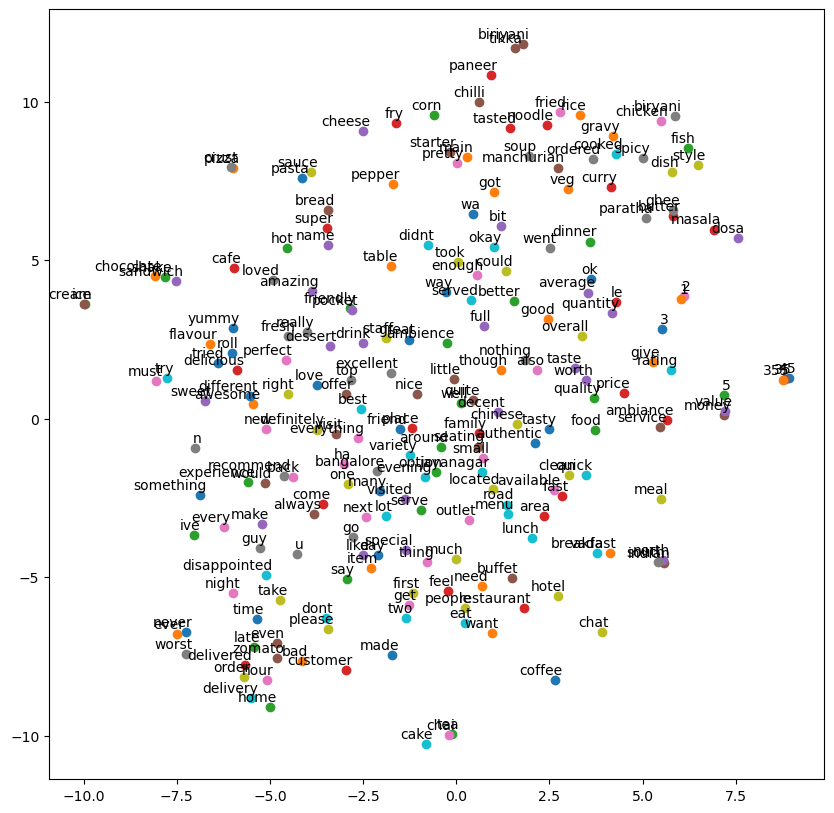

In [67]:
tsne_plot(model)

<h2>T-SNE of adjectivs used in positive reviws</h2>

In [68]:
postive=rating_df[rating_df['rating']>3]['review'][:2000]
negative=rating_df[rating_df['rating']<2.5]['review'][:2000]

def return_corpus(df):
    corpus=[]
    for review in df:
        tagged=nltk.pos_tag(word_tokenize(review))
        adj=[]
        for x in tagged:
            if x[1]=='JJ':
                adj.append(x[0])
        corpus.append(adj)
    return corpus

Wow,we can observe all the adjective used in the postive reviews represented in the 2D space.

/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



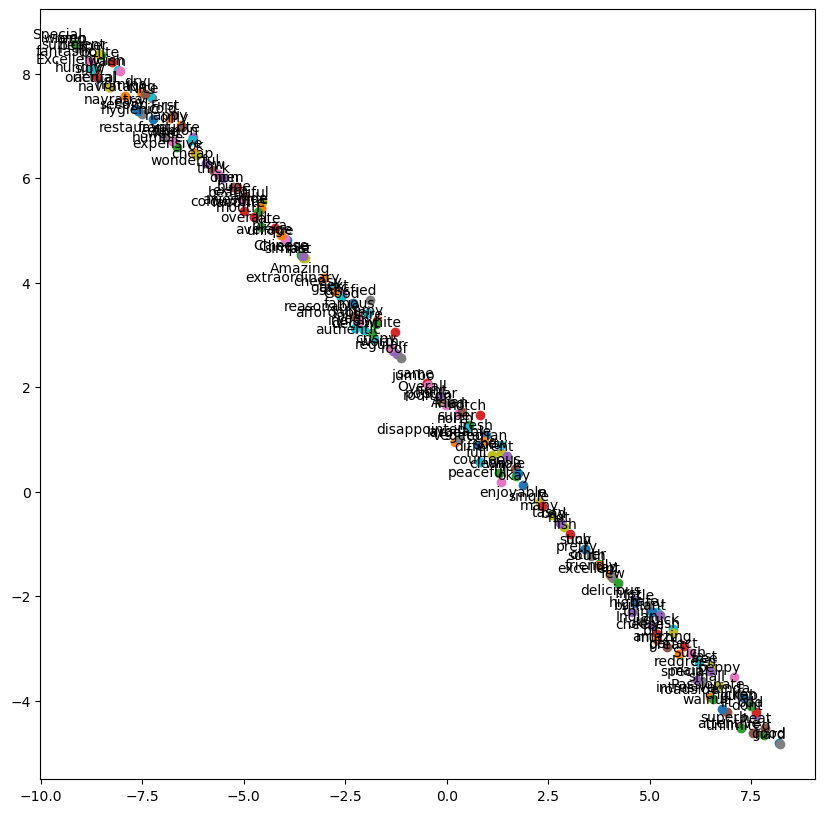

In [69]:
corpus=return_corpus(postive)
model = word2vec.Word2Vec(corpus, min_count=10,window=20, workers=4)
tsne_plot(model)

<h2>T-SNE of adjectives used in Negative reviews</h2>

/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/home/neel/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:982: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



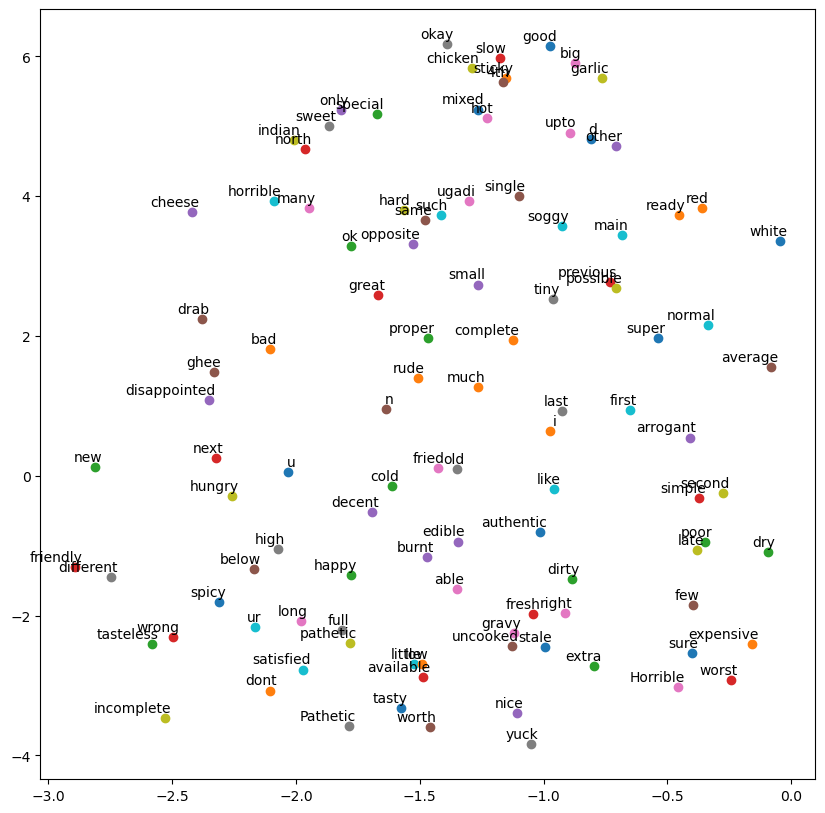

In [70]:
corpus = return_corpus(negative)
model = word2vec.Word2Vec(corpus, min_count=10, window=20, workers=4)
tsne_plot(model)

<h2>Sentiment Analysis</h2>
Sentiment Analysis is the process of computationally determining whether a piece of writing is positive, negative or neutral. It’s also known as opinion mining, deriving the opinion or attitude of a speaker.

For doing sentimental analysis on reviews provided bt users.We have to prepare our data in appropriate format.
We will map reviews to positive and negative on the basis of the ratings provided by each user.So,we will map reviews to negative if the rating given is less than 2.5 and positive if rating is greater than 2.5 

In [71]:
rating_df['sent'] = rating_df['rating'].apply(lambda x: 1 if int(x)>2.5 else 0)

- Next, we will tokenize the data and vectorize the reviews to feed it to our model.

In [73]:
max_features = 3000
tokenizer = Tokenizer(num_words=max_features, split=' ')
tokenizer.fit_on_texts(rating_df['review'].values)
X = tokenizer.texts_to_sequences(rating_df['review'].values)
X = pad_sequences(X)

<h2>Building our model</h2>

In [74]:
embed_dim = 32
lstm_out = 32

model = Sequential()
model.add(Embedding(max_features, embed_dim, input_length=X.shape[1]))
model.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(2, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

2023-03-25 19:47:46.859962: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-03-25 19:47:46.860814: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-03-25 19:47:46.861667: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (pop-os): /proc/driver/nvidia/version does not exist
2023-03-25 19:47:46.867932: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 194, 32)           96000     
                                                                 
 lstm (LSTM)                 (None, 32)                8320      
                                                                 
 dense (Dense)               (None, 2)                 66        
                                                                 
Total params: 104,386
Trainable params: 104,386
Non-trainable params: 0
_________________________________________________________________
None


<h2>Train and test split</h2>
- We will now encode our target variable. **pd.get_dummies** is used for on-hot encoding.
- 33 percent of data is reserved for testing our model

In [75]:
# The get_dummies function is used to convert categorical variables into dummy or indicator variables. 
# A dummy or indicator variable can have a value of 0 or 1.
Y = pd.get_dummies(rating_df['sent'].astype(int)).values
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(884378, 194) (884378, 2)
(435590, 194) (435590, 2)


In [76]:
batch_size = 32
model.fit(x_train, y_train, epochs=5, batch_size=batch_size)

KeyboardInterrupt: 

<h2>Validating our model</h2>
We will take 1500 rows to validate our model.We have choosen **accuacy** to be our evaluation criteria.

In [ ]:
validation_size = 1500

X_validate = x_test[-validation_size:]
Y_validate = y_test[-validation_size:]
X_test = x_test[:-validation_size]
Y_test = y_test[:-validation_size]
score,acc = model.evaluate(X_test, Y_test, verbose = 2, batch_size = batch_size)
print("score: %.2f" % (score))
print("acc: %.2f" % (acc))

<h2>